In [367]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import xlrd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import MinMaxScaler

from sklearn.linear_model import LinearRegression
from sklearn.datasets import make_regression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import GridSearchCV
from sklearn import datasets, linear_model
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import LabelEncoder


In [368]:
# Using the original data set
df = pd.read_csv("C:/Users/elon6/Desktop/פרויקט גמר/מחודש/activities_demographics.csv")


In [369]:
# change to datatime
df['modified'] = pd.to_datetime(df['modified'])

# Calculate time difference between consecutive 'modified' values for each student
df['time_difference'] = df.groupby('student_id')['modified'].diff()

df['time_difference'] = df['time_difference'].dt.total_seconds() / (24 * 60 * 60)  # Convert to numeric values in days

# Calculate standard deviation of time differences for each student
average_time_difference = df.groupby('student_id')['time_difference'].mean()
sd_time_difference = df.groupby('student_id')['time_difference'].std()

# the sd only for the moudle with grade
new = df[df["grade"].notnull()]

new['time_difference'] = new.groupby('student_id')['modified'].diff()
new['time_difference'] = new['time_difference'] / pd.Timedelta(days=1)

sd_time_difference_attem = new.groupby('student_id')['time_difference'].std()

C:\Users\elon6\AppData\Local\Temp\ipykernel_9156\4083081612.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new['time_difference'] = new.groupby('student_id')['modified'].diff()
C:\Users\elon6\AppData\Local\Temp\ipykernel_9156\4083081612.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new['time_difference'] = new['time_difference'] / pd.Timedelta(days=1)


### Creat the new columns:
#### average_time_difference 
#### sd_time_difference 
#### sd_time_difference_attem
#### SeasonNumber

#### Upload the data

In [399]:
data = pd.read_csv("C:\\Users\\elon6\\Desktop\\פרויקט גמר\\מחודש\\data_attem_30.csv")
data = data.set_index('student_id')
data

,Percent_All_Activities,Percent_Prob,Percent_Vid,gender,year_of_birth,Average_num_of_attempts,Sum_of_attempts,Min_of_date_joined,active,last_login,significant,Avr_grade,time_in_system,attem_rate,finish
student_id,,,,,,,,,,,,,,,
3,99,99.40,0.97,m,1991,1.67,20,15/02/2018,1,16/01/2023,0,63,1796,0.95,1
4,80,99.40,0.37,m,1984,1.23,27,15/02/2018,1,12/01/2023,0,99,1792,0.90,1
14,13,13.60,0.11,m,1991,1.57,11,26/03/2018,1,18/03/2020,0,100,723,0.79,0
17,76,84.00,0.59,m,1990,1.47,125,16/04/2018,1,26/01/2021,0,100,1016,0.54,0
23,17,19.10,0.12,m,1962,1.50,3,18/04/2018,1,26/06/2022,0,100,1530,0.95,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83448,1,0.00,0.03,m,1998,0.00,0,24/04/2022,0,13/07/2022,0,0,80,1.00,0
84541,1,0.00,0.03,m,1982,0.00,0,18/05/2022,0,18/05/2022,0,0,0,1.00,0
85875,3,4.30,0.00,m,2006,0.00,0,27/06/2022,0,07/07/2022,0,0,10,1.00,0


In [400]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11902 entries, 3 to 87247
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Percent_All_Activities   11902 non-null  int64  
 1   Percent_Prob             11902 non-null  float64
 2   Percent_Vid              11902 non-null  float64
 3   gender                   11902 non-null  object 
 4   year_of_birth            11902 non-null  int64  
 5   Average_num_of_attempts  11902 non-null  float64
 6   Sum_of_attempts          11902 non-null  int64  
 7   Min_of_date_joined       11902 non-null  object 
 8   active                   11902 non-null  int64  
 9   last_login               11902 non-null  object 
 10  significant              11902 non-null  int64  
 11  Avr_grade                11902 non-null  int64  
 12  time_in_system           11902 non-null  int64  
 13  attem_rate               11902 non-null  float64
 14  finish                

In [401]:
#Onehot encoding
le = LabelEncoder()
data['gender'] = le.fit_transform(data['gender']) #1- Male, 0 - Woman

In [402]:
# Convert dates columns to datetime format

data["Min_of_date_joined"] = pd.to_datetime(data["Min_of_date_joined"], format = "%d/%m/%Y")
data["last_login"] = pd.to_datetime(data["last_login"], format = "%d/%m/%Y")
data['Min_of_date_joined'] = pd.to_datetime(data['Min_of_date_joined'], format='%d/%m/%Y')


In [403]:
data["average_time_difference"] = average_time_difference.fillna(0)
data["sd_time_difference"] = sd_time_difference.fillna(0)
data["sd_time_difference_attem"] = sd_time_difference_attem
data["sd_time_difference_attem"] = data["sd_time_difference_attem"].fillna(0)


In [404]:
# Convert 'Min_of_date_joined' column to datetime format

# Define a dictionary mapping month numbers to seasons
season_mapping = {
    12: 'Winter',
    1: 'Winter',
    2: 'Winter',
    3: 'Spring',
    4: 'Spring',
    5: 'Spring',
    6: 'Summer',
    7: 'Summer',
    8: 'Summer',
    9: 'Autumn',
    10: 'Autumn',
    11: 'Autumn'
}

# Create a new column 'Season' based on the month of 'Min_of_date_joined'
df['Season'] = data['Min_of_date_joined'].dt.month.map(season_mapping)

# each seson getting a number
season_number_mapping = {
    'Winter': 1,
    'Spring': 2,
    'Summer': 3,
    'Autumn': 4
}

# Create a new column 'SeasonNumber' with the corresponding number for each season
data['SeasonNumber'] = df['Season'].map(season_number_mapping)
data['SeasonNumber'] = data['SeasonNumber'].astype(int)

In [405]:
#Display change
pd.options.display.float_format = '{:.2f}'.format

##### seperate the dates to 3 different coulmns 

In [406]:

data["date_joined_year"] = data["Min_of_date_joined"].dt.year
data["date_joined_month"] = data["Min_of_date_joined"].dt.month
data["date_joined_day"] = data["Min_of_date_joined"].dt.day
data["last_login_year"] = data["last_login"].dt.year
data["last_login_month"] = data["last_login"].dt.month
data["last_login_day"] = data["last_login"].dt.day

In [407]:
conditions = [
    (data['year_of_birth'] > 2010),
    (data['year_of_birth'] > 2000),
    (data['year_of_birth'] > 1990),
    (data['year_of_birth'] > 1980),
    (data['year_of_birth'] > 1970),
    (data['year_of_birth'] < 1960)
]
values = [1,2,3,4,5,6]

# Use numpy.select() to assign values based on conditions
data['age'] = np.select(conditions, values)


##### Drop coulmns that dont need to be part of the model

In [408]:
complte_data = data
data = data.drop(["Min_of_date_joined","Percent_Prob","Sum_of_attempts","significant",'Percent_All_Activities', 'Percent_Vid',"last_login",], axis = 1)

### Data after changes

In [409]:
data

,gender,year_of_birth,Average_num_of_attempts,active,Avr_grade,time_in_system,attem_rate,finish,average_time_difference,sd_time_difference,sd_time_difference_attem,SeasonNumber,date_joined_year,date_joined_month,date_joined_day,last_login_year,last_login_month,last_login_day,age
student_id,,,,,,,,,,,,,,,,,,,
3,1,1991,1.67,1,63,1796,0.95,1,1.89,451.54,592.46,1,2018,2,15,2023,1,16,3
4,1,1984,1.23,1,99,1792,0.90,1,-0.08,515.95,422.75,1,2018,2,15,2023,1,12,4
14,1,1991,1.57,1,100,723,0.79,0,0.00,0.01,0.00,2,2018,3,26,2020,3,18,3
17,1,1990,1.47,1,100,1016,0.54,0,0.18,234.97,26.24,2,2018,4,16,2021,1,26,4
23,1,1962,1.50,1,100,1530,0.95,0,0.00,199.33,0.00,2,2018,4,18,2022,6,26,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83448,1,1998,0.00,0,0,80,1.00,0,-0.00,0.00,0.00,2,2022,4,24,2022,7,13,3
84541,1,1982,0.00,0,0,0,1.00,0,-0.00,0.00,0.00,2,2022,5,18,2022,5,18,4
85875,1,2006,0.00,0,0,10,1.00,0,0.00,0.00,0.00,3,2022,6,27,2022,7,7,2


<AxesSubplot:>

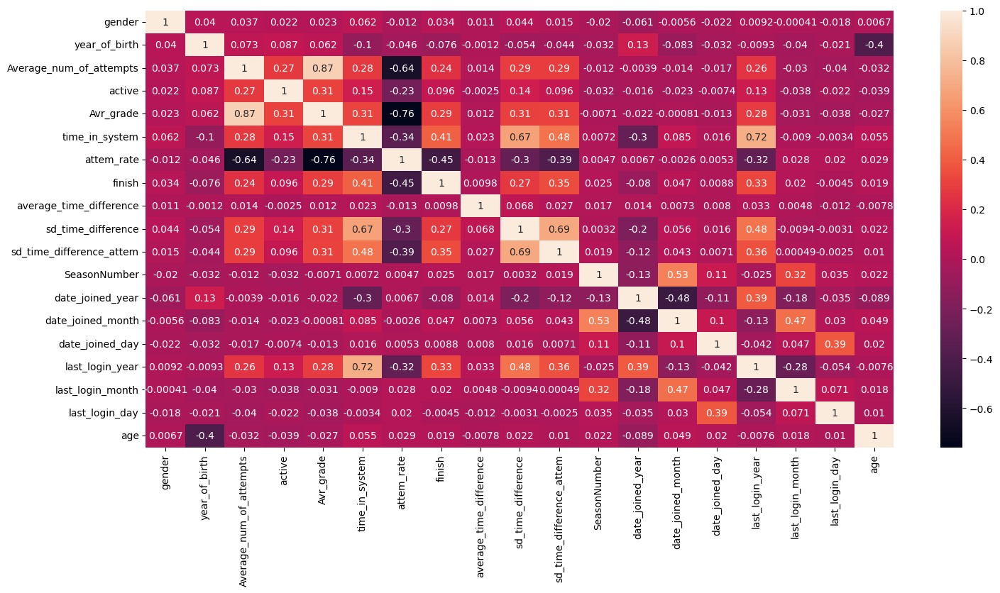

In [410]:
# creating correlation heatmap using seaborn lib. 
cor_mat=data.corr()
fig=plt.figure(figsize=(17,8))
sns.heatmap(data=cor_mat,annot=True)

In [411]:
# load statmodels functions
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# compute the vif for all given features
def compute_vif(considered_features):
    
    X = data[considered_features]
    # the calculation of variance inflation requires a constant
    X['intercept'] = 1
    
    # create dataframe to store vif values
    vif = pd.DataFrame()
    vif["Variable"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif = vif[vif['Variable']!='intercept']
    return vif

In [414]:
# features to consider removing
considered_features = ['Average_num_of_attempts','Avr_grade', 'attem_rate', 'average_time_difference', 'sd_time_difference',"date_joined_year","sd_time_difference_attem"]

# compute vif 
compute_vif(considered_features).sort_values('VIF', ascending=False)

C:\Users\elon6\AppData\Local\Temp\ipykernel_9156\2665680971.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['intercept'] = 1


,Variable,VIF
1,Avr_grade,5.90
0,Average_num_of_attempts,4.26
2,attem_rate,2.54
6,sd_time_difference_attem,2.10
4,sd_time_difference,2.04
5,date_joined_year,1.05
3,average_time_difference,1.01


In [415]:
# compute vif values after removing a feature
considered_features.remove('Avr_grade')
compute_vif(considered_features)

C:\Users\elon6\AppData\Local\Temp\ipykernel_9156\2665680971.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['intercept'] = 1


,Variable,VIF
0,Average_num_of_attempts,1.73
1,attem_rate,1.84
2,average_time_difference,1.01
3,sd_time_difference,2.03
4,date_joined_year,1.05
5,sd_time_difference_attem,2.08


In [416]:
data = data.drop(["Avr_grade",], axis = 1)

In [300]:
from pandas_profiling import ProfileReport


In [195]:
#profiler = ProfileReport(data)
#profiler.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [301]:
data.to_csv("C:/Users/elon6/Desktop/פרויקט גמר/מחודש/data-06.csv", index=False)
